# Airbnb American Cities Maps: New York

In [20]:
# Shapefile: https://data.cityofnewyork.us/Housing-Development/Shapefiles-and-base-map/2k7f-6s2k


In [19]:
# Shapefiile: #https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv(r'/Users/zhanebennett/Downloads/archive-2/AB_NYC_2019.csv')

%matplotlib inline

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
plt.style.use('ggplot')

df.columns.tolist()


In [2]:
df.shape


(48895, 16)

## MAP

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon

%matplotlib inline


In [4]:
import geopandas as gpd


In [5]:
nyc_shp = gpd.read_file("foldernyc/geo_export_b140b4a3-2a45-430c-9881-1043d75182a5.shp")
print(nyc_shp)


                bbl        bin built_code  cnstrct_yr   doitt_id  feat_code  \
0        4155980564  4462384.0        NaN      2001.0   939203.0     2100.0   
1        4163500400  4467306.0          E      1938.0   107990.0     2100.0   
2        4160290023  4529256.0          E      1920.0   931167.0     5110.0   
3        4163250001  4540232.0        NaN         0.0    86053.0     2100.0   
4        4160900043  4530675.0        NaN      2004.0   998592.0     2100.0   
...             ...        ...        ...         ...        ...        ...   
1082344  1270029880  1795020.0        NaN      2016.0  1273171.0     2110.0   
1082345  2270029999  2795001.0        NaN      2016.0  1273175.0     2110.0   
1082346  1014890008  1795027.0        NaN      1900.0  1273172.0     2110.0   
1082347  1270029999  1795001.0        NaN      2016.0  1273167.0     2110.0   
1082348  1270029987  1795013.0        NaN      2016.0  1273170.0     2110.0   

         groundelev  heightroof  date_lstmo    time

In [6]:
nyc_shp.columns


Index(['bbl', 'bin', 'built_code', 'cnstrct_yr', 'doitt_id', 'feat_code',
       'groundelev', 'heightroof', 'date_lstmo', 'time_lstmo', 'lststatype',
       'name', 'num_floors', 'shape_area', 'shape_len', 'sub_code',
       'geometry'],
      dtype='object')

<AxesSubplot:>

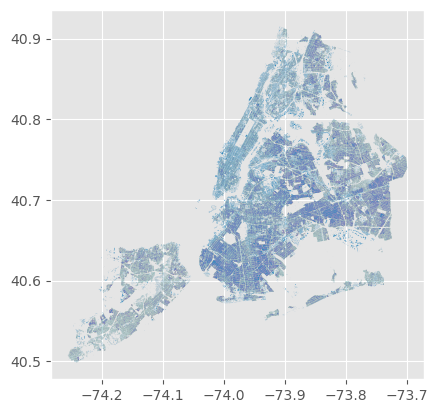

In [7]:
nyc_shp.plot()


In [8]:
nyc_bor_shp = gpd.read_file("foldernycbor/geo_export_e2ba4e93-de50-4f15-9767-0ccb9cfaf84a.shp")
print(nyc_bor_shp)


   boro_code      boro_name    shape_area     shape_leng  \
0        5.0  Staten Island  1.623621e+09  325917.353702   
1        2.0          Bronx  1.187175e+09  463179.772813   
2        1.0      Manhattan  6.365208e+08  357564.316391   
3        3.0       Brooklyn  1.934143e+09  728197.541089   
4        4.0         Queens  3.041419e+09  888199.731579   

                                            geometry  
0  MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ...  
1  MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ...  
2  MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ...  
3  MULTIPOLYGON (((-73.86327 40.58388, -73.86381 ...  
4  MULTIPOLYGON (((-73.82645 40.59053, -73.82642 ...  


<AxesSubplot:>

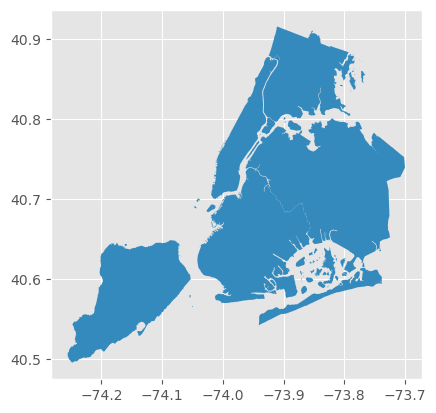

In [9]:
nyc_bor_shp.plot()


In [12]:
crs = {'init':'epsg:4326'}
geometry_nyc_bor = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
geometry_nyc_bor[:3]


[<POINT (-73.972 40.647)>, <POINT (-73.984 40.754)>, <POINT (-73.942 40.809)>]

In [13]:
geo_df = gpd.GeoDataFrame(df, #specify our data
                          crs=crs, #specify our coordinate reference system
                          geometry=geometry_nyc_bor) #specify the geometry list we created
geo_df.head()


/Users/zhanebennett/opt/anaconda3/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,geometry
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,POINT (-73.97237 40.64749)
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,POINT (-73.98377 40.75362)
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365,POINT (-73.94190 40.80902)
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194,POINT (-73.95976 40.68514)
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,POINT (-73.94399 40.79851)


In [24]:
import numpy as np
outliers = geo_df[['price']].dropna()
outliers = outliers.loc[~outliers.apply(lambda x: np.abs(x - x.mean()) / x.std() < 3).all(axis=1)]

outliers = geo_df[['price']].dropna()
outliers2 = geo_df.loc[outliers.apply(lambda x: np.abs(x - x.mean()) / x.std() < 3).all(axis=1)]
#outliers2.apply(lambda x: np.abs(x - x.mean()) / x.std() < 3).all(axis=1)
outliers2.head()


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,geometry
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,POINT (-73.97237 40.64749)
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,POINT (-73.98377 40.75362)
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365,POINT (-73.94190 40.80902)
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194,POINT (-73.95976 40.68514)
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,POINT (-73.94399 40.79851)


In [25]:
outliers2.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'geometry'],
      dtype='object')

Text(0.5, 1.0, 'Price')

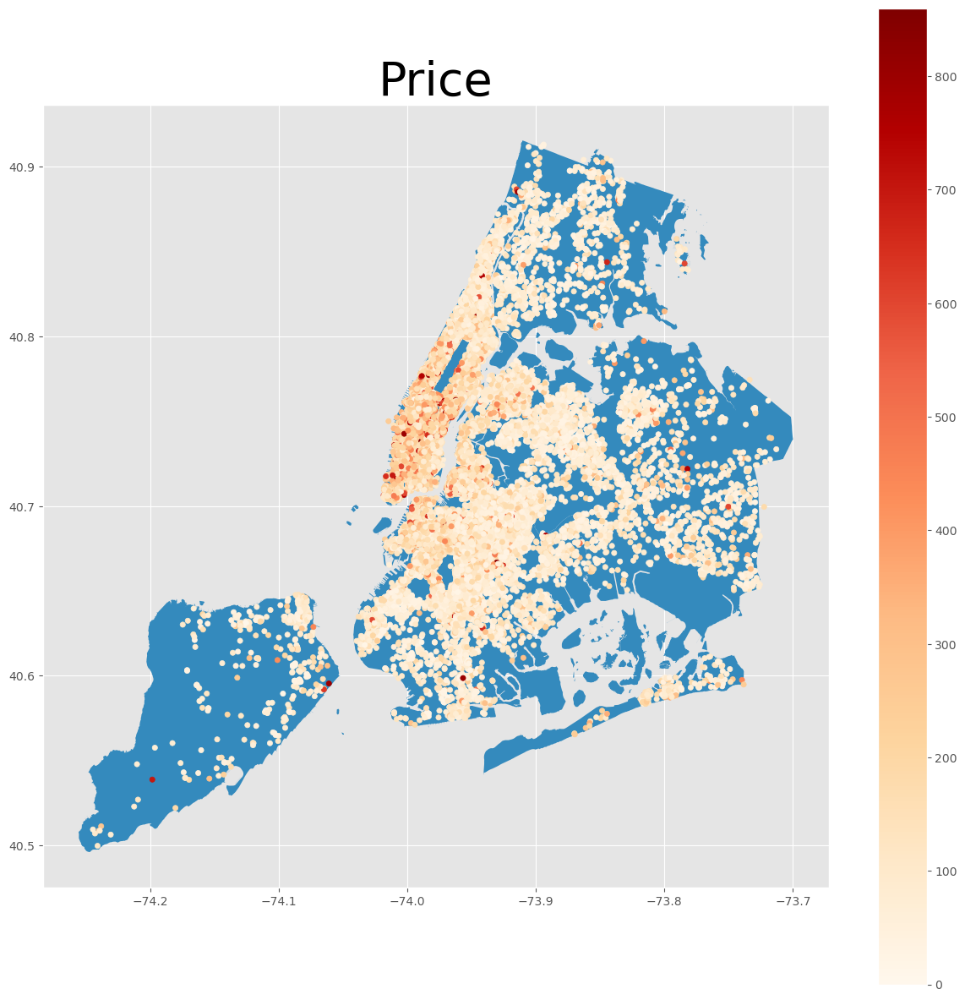

In [44]:
fig, ax = plt.subplots(figsize=(15,15))
nyc_bor_shp.plot(ax=ax)
outliers2.plot(ax=ax, 
                                       markersize=20, 
                                       column= outliers2['price'],
                                       cmap= 'OrRd',
                                       #color='blue', 
                                       marker='o', 
                                       #label='Neg',
                                    legend=True)
plt.title(label="Price", fontsize=40)


## Plotting Variables
- Name
- Host Id
- Neighborhood group
- Neighborhood
- Room Type
- Price
- Minimum Nights
- Number of Reviews
- Last Review
- Reviews Per Month
- Calculated Host Listings Count
- Availability 365

Text(0.5, 1.0, 'Borough')

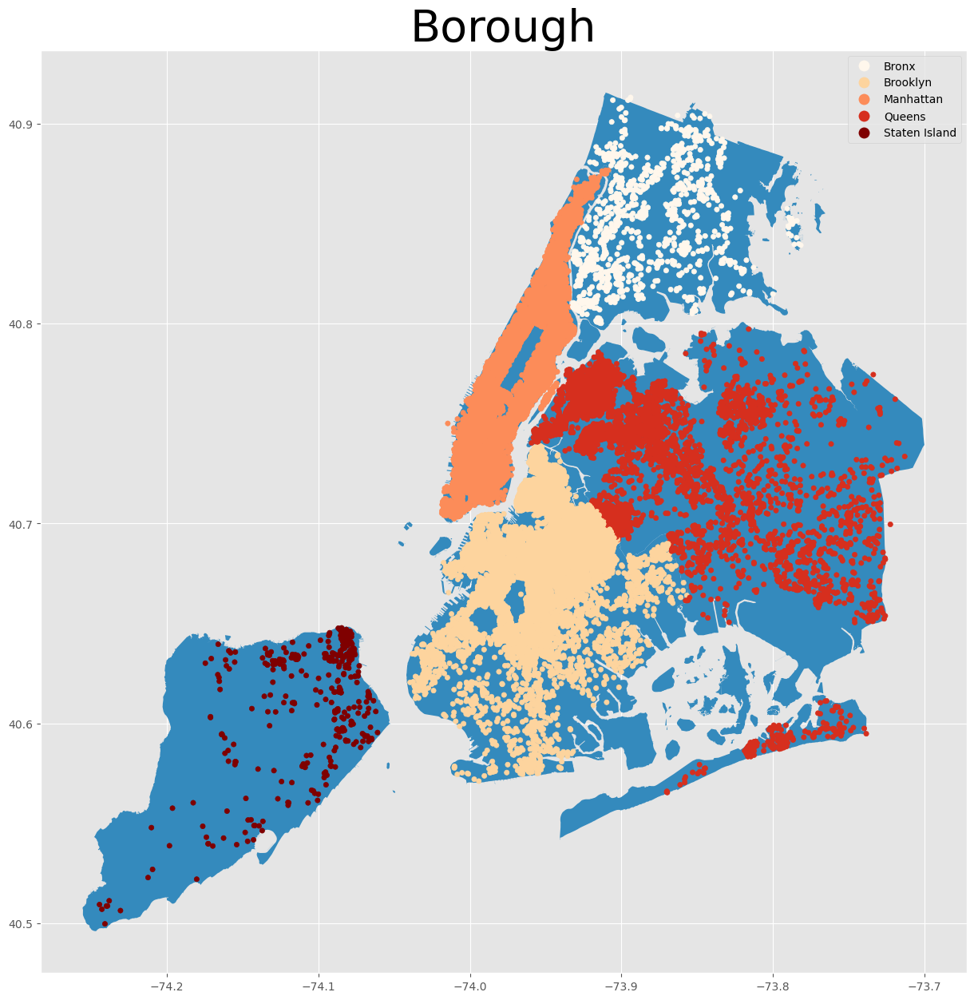

In [45]:
fig, ax = plt.subplots(figsize=(15,15))
nyc_bor_shp.plot(ax=ax)
outliers2.plot(ax=ax, 
                                       markersize=20, 
                                       column= outliers2['neighbourhood_group'],
                                       cmap= 'OrRd',
                                       #color='blue', 
                                       marker='o', 
                                       #label='Neg',
                                    legend=True)
plt.title(label="Borough", fontsize=40)


Text(0.5, 1.0, 'Neighborhoods')

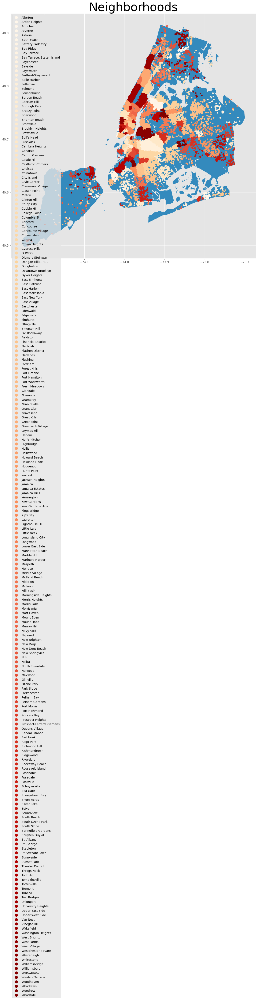

In [46]:
fig, ax = plt.subplots(figsize=(15,15))
nyc_bor_shp.plot(ax=ax)
outliers2.plot(ax=ax, 
                                       markersize=20, 
                                       column= outliers2['neighbourhood'],
                                       cmap= 'OrRd',
                                       #color='blue', 
                                       marker='o', 
                                       #label='Neg',
                                    legend=True)
plt.title(label="Neighborhoods", fontsize=40)


Text(0.5, 1.0, 'Room Type')

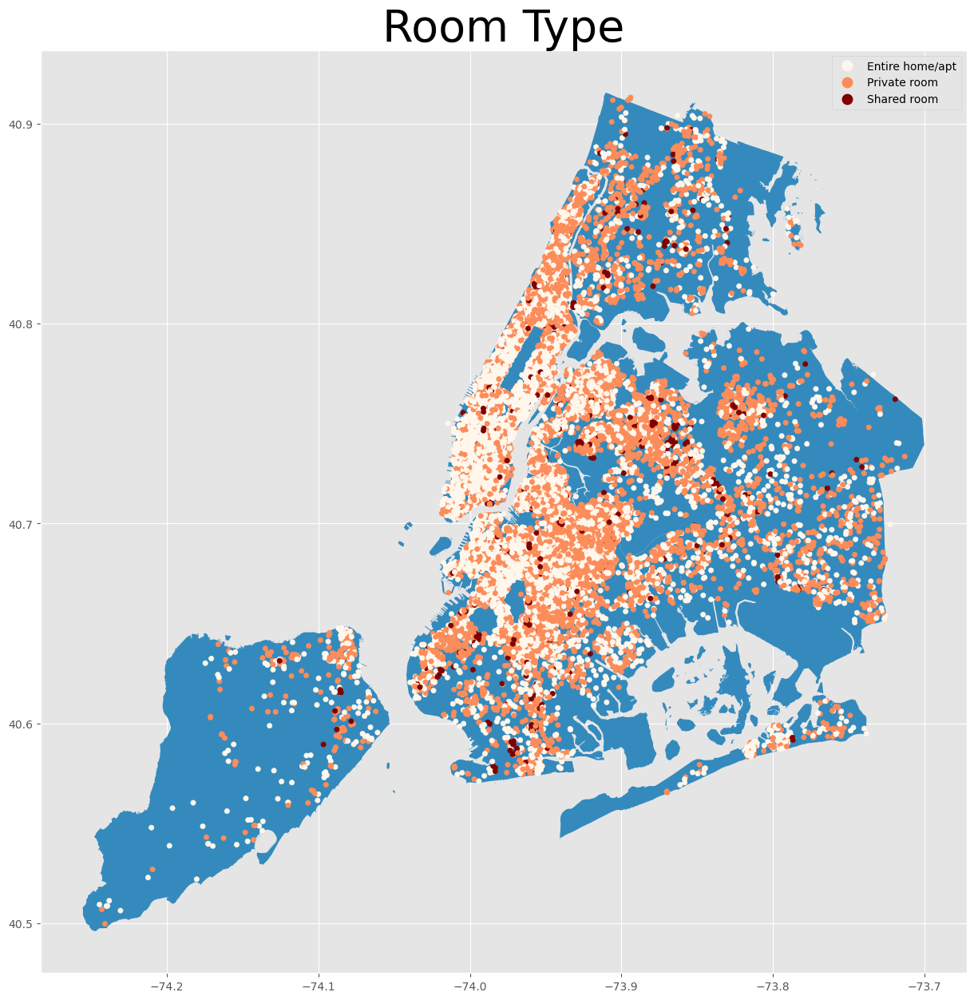

In [47]:
fig, ax = plt.subplots(figsize=(15,15))
nyc_bor_shp.plot(ax=ax)
outliers2.plot(ax=ax, 
                                       markersize=20, 
                                       column= outliers2['room_type'],
                                       cmap= 'OrRd',
                                       #color='blue', 
                                       marker='o', 
                                       #label='Neg',
                                    legend=True)

plt.title(label="Room Type", fontsize=40)


Text(0.5, 1.0, 'Minimum Nights')

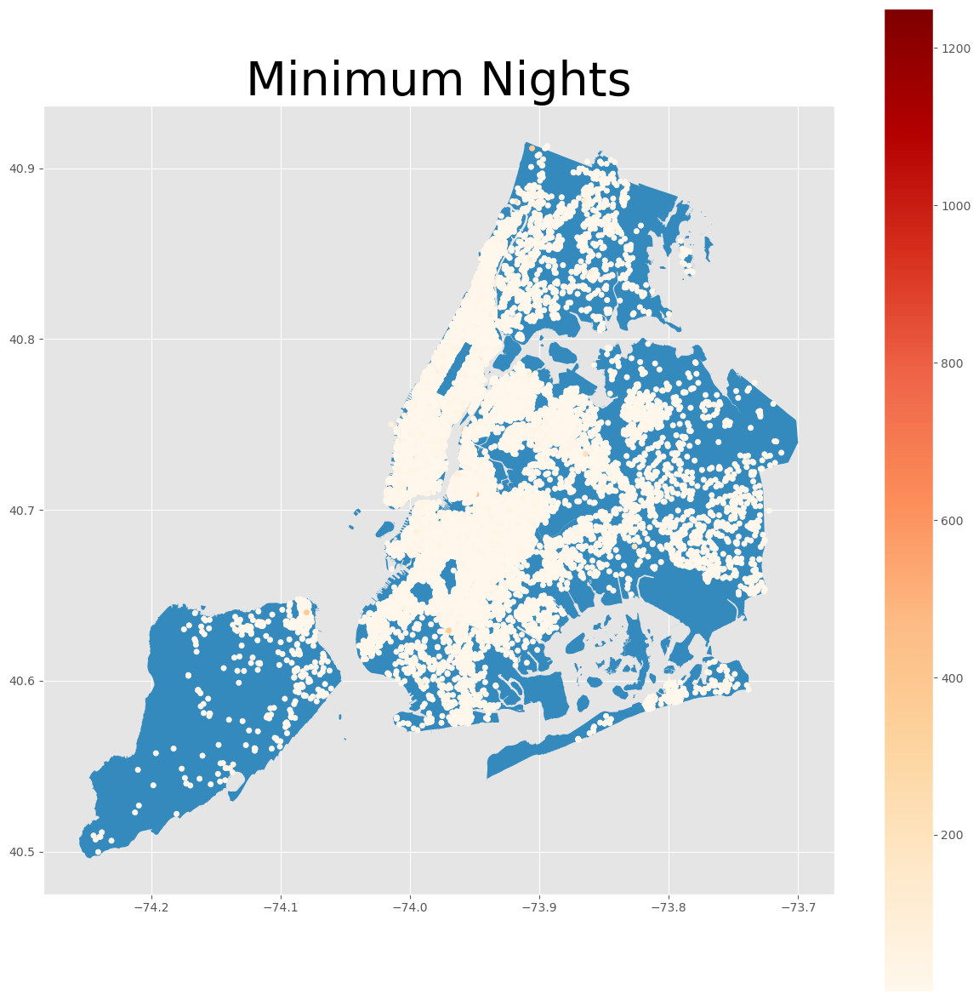

In [48]:
fig, ax = plt.subplots(figsize=(15,15))
nyc_bor_shp.plot(ax=ax)
outliers2.plot(ax=ax, 
                                       markersize=20, 
                                       column= outliers2['minimum_nights'],
                                       cmap= 'OrRd',
                                       #color='blue', 
                                       marker='o', 
                                       #label='Neg',
                                    legend=True)
plt.title(label="Minimum Nights", fontsize=40)


Text(0.5, 1.0, 'Number of Reviews')

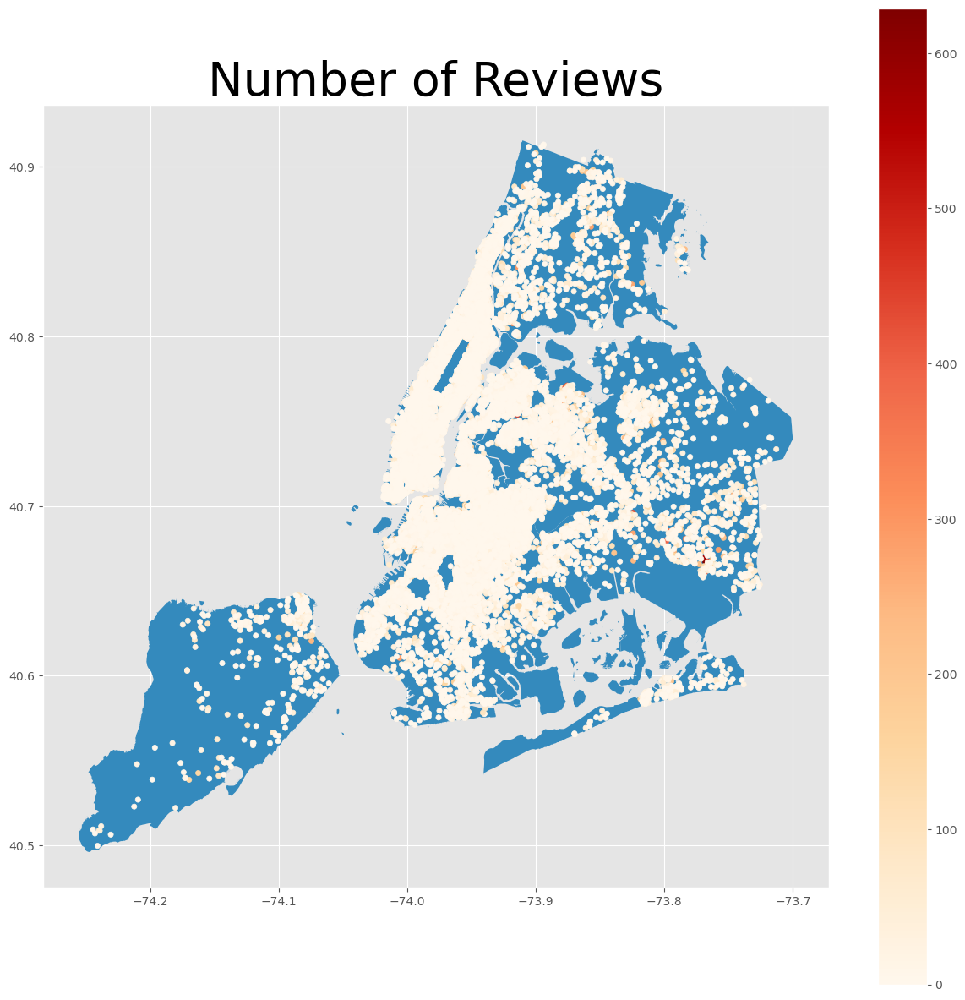

In [49]:
fig, ax = plt.subplots(figsize=(15,15))
nyc_bor_shp.plot(ax=ax)
outliers2.plot(ax=ax, 
                                       markersize=20, 
                                       column= outliers2['number_of_reviews'],
                                       cmap= 'OrRd',
                                       #color='blue', 
                                       marker='o', 
                                       #label='Neg',
                                    legend=True)
plt.title(label="Number of Reviews", fontsize=40)


Text(0.5, 1.0, 'Last Review')

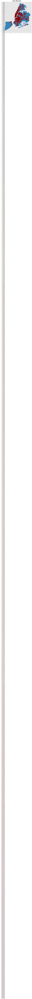

In [51]:
fig, ax = plt.subplots(figsize=(15,15))
nyc_bor_shp.plot(ax=ax)
outliers2.plot(ax=ax, 
                                       markersize=20, 
                                       column= outliers2['last_review'],
                                       cmap= 'OrRd',
                                       #color='blue', 
                                       marker='o', 
                                       #label='Neg',
                                    legend=True)
plt.title(label="Last Review", fontsize=40)


Text(0.5, 1.0, 'Reviews Per Month')

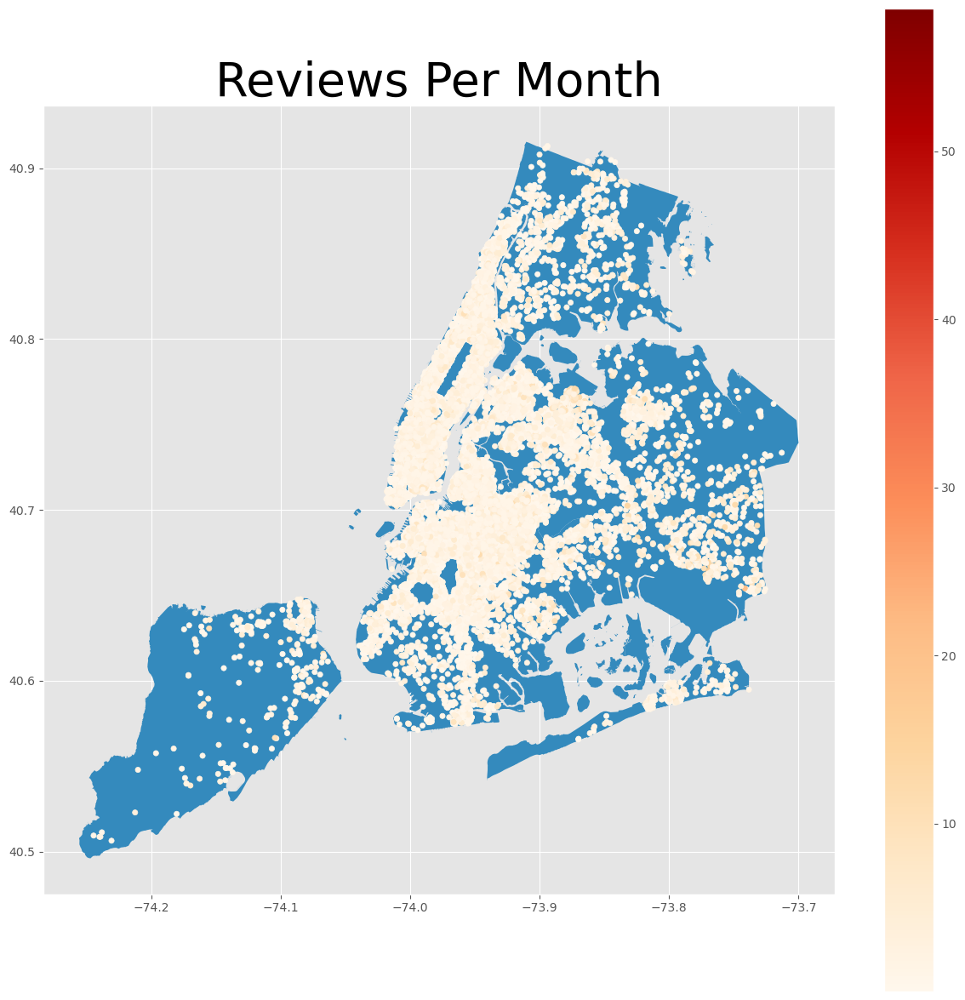

In [55]:
fig, ax = plt.subplots(figsize=(15,15))
nyc_bor_shp.plot(ax=ax)
outliers2.plot(ax=ax, 
                                       markersize=20, 
                                       column= outliers2['reviews_per_month'],
                                       cmap= 'OrRd',
                                       #color='blue', 
                                       marker='o', 
                                       #label='Neg',
                                    legend=True)

plt.title(label="Reviews Per Month", fontsize=40)


Text(0.5, 1.0, 'Listings Count per Host')

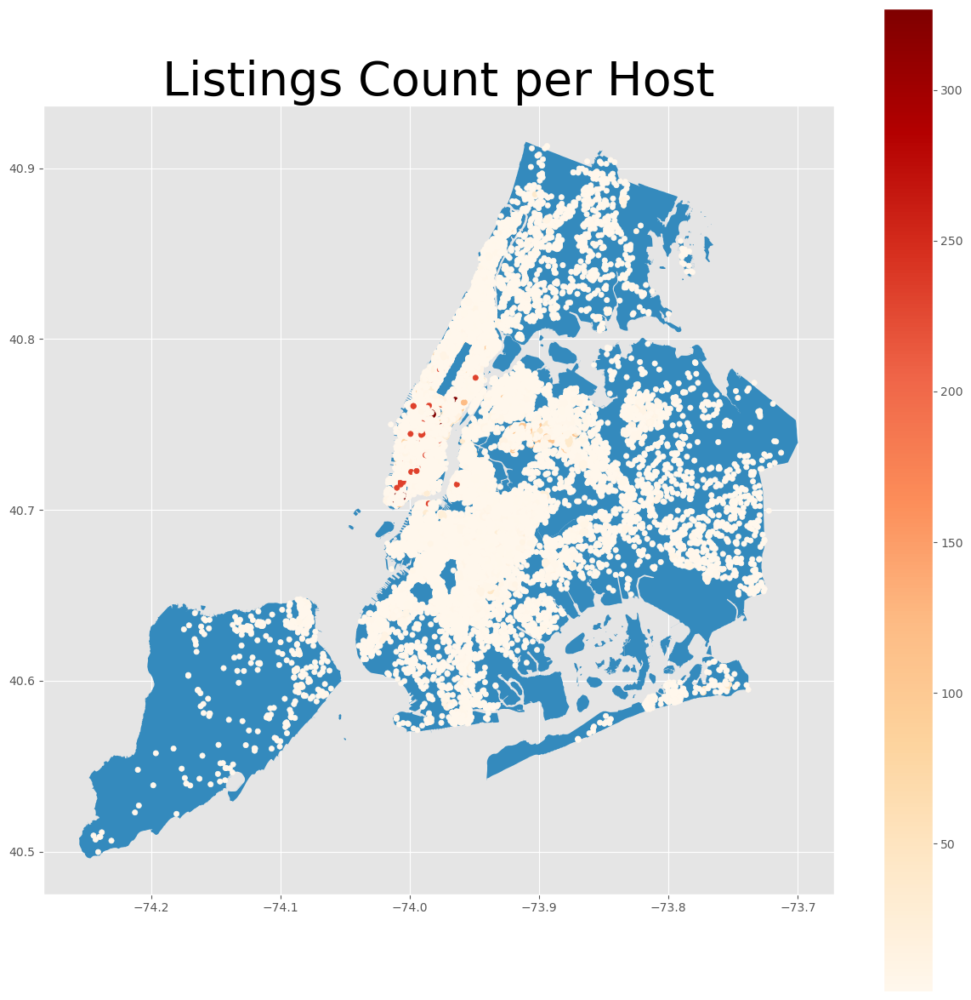

In [56]:
fig, ax = plt.subplots(figsize=(15,15))
nyc_bor_shp.plot(ax=ax)
outliers2.plot(ax=ax, 
                                       markersize=20, 
                                       column= outliers2['calculated_host_listings_count'],
                                       cmap= 'OrRd',
                                       #color='blue', 
                                       marker='o', 
                                       #label='Neg',
                                    legend=True)

plt.title(label="Listings Count per Host", fontsize=40)


Text(0.5, 1.0, 'Listing Availability')

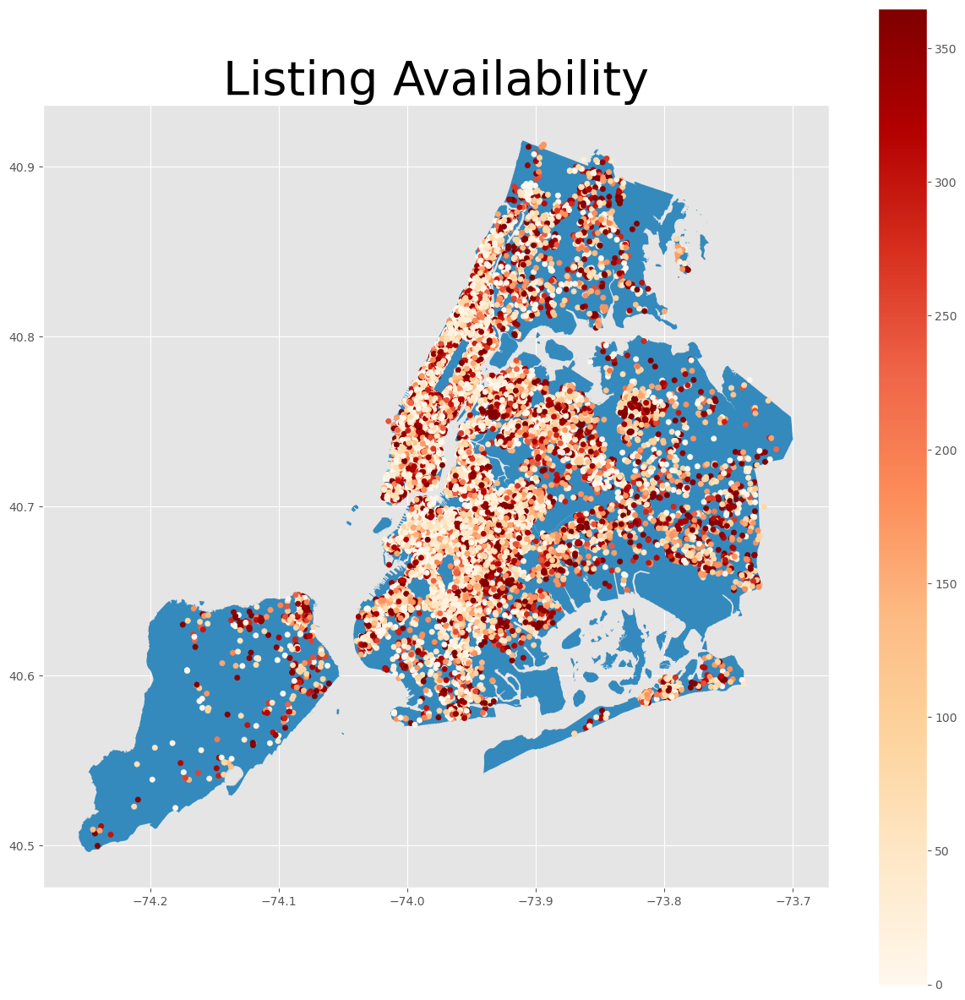

In [64]:
fig, ax = plt.subplots(figsize=(15,15))
nyc_bor_shp.plot(ax=ax)
outliers2.plot(ax=ax, 
                                       markersize=20, 
                                       column= outliers2['availability_365'],
                                       cmap= 'OrRd',
                                       #color='blue', 
                                       marker='o', 
                                       #label='Neg',
                                    legend=True)

plt.title(label="Listing Availability", fontsize=40)
